# Computer vision - Laboratory

==============================================================================================
## Practicum 2: Filtering and edge detection

==============================================================================================

The main topics are:
1. Convolution
2. Image smoothing
3. Edge detection
4. Applications: Hybrid images and video anonimization

In order to complete this practicum, the following concepts need to be understood: linear filters, histograms, convolutions, and edges.

The following chapters of the book "Computer Vision: Algorithms and Applications" by Richard Szeliski provide additional information:
* Chapter 3. Image processing: Point operators & linear filtering.
* Chapter 4. Feature detection and matching: Edges.

In [16]:
import numpy as np # useful for manipulating matrices
from skimage import io # useful for image loading and saving
from matplotlib import pyplot as plt # useful for plotting images on iPython or Jupyter Notebooks
%matplotlib inline

### 2.1 Image processing with different scales and filters

a) Read the image "face.png" and analyse its histogram. What is the histogram representing for an image?

- Visualize the R, G, and B channels of the image.

- Visualize the histogram of a color image with the following characteristics:

    - Obtain the histogram with 8, 32, 64 and 256 bins. 

    - Visualize the histogram of each channel and the gray level image and compare them. Comment their difference (see image bellow as an example of histogram extraction).

Note: What type should be the image in order to compute the histogram? Check using different bins for the histogram. 

Hint: the `exposure` module within the `skimage` library makes the histogram extraction easy!

Help: [matplotlib image tutorial](https://matplotlib.org/users/image_tutorial.html)

<img src='images_for_notebook/ex21a.png'>

In [17]:
from skimage.color import rgb2gray
from skimage import img_as_float
from skimage import exposure

    
face = io.imread('images/face.png')
    
face_gray = face.copy()
faceR = face.copy()
faceG = face.copy()
faceB = face.copy()
    
face_gray = rgb2gray(face)
faceR = img_as_float(faceR[:,:,0])
faceG = img_as_float(faceG[:,:,1])
faceB = img_as_float(faceB[:,:,2])

def histograma_(nbins_in):

    hist_gray, bins_gray = exposure.histogram(face_gray, nbins = nbins_in)
    hist_r, bins_r = exposure.histogram(faceR, nbins = nbins_in)
    hist_g, bins_g = exposure.histogram(faceG, nbins = nbins_in)
    hist_b, bins_b = exposure.histogram(faceB, nbins = nbins_in)

    fig, ax = plt.subplots(figsize=(10,2))

    ind = np.arange(nbins_in)
    width = 0.2
    
    
    rects_gray = ax.bar(ind, hist_gray, width, color = 'y')
    rects_r = ax.bar(ind + width, hist_r, width, color = 'r')
    rects_g = ax.bar(ind + 2 * width, hist_g, width, color = 'g')
    rects_b = ax.bar(ind + 3 * width, hist_b, width, color = 'b')
    
    ax.legend((rects_gray[0], rects_r[0], rects_g[0], rects_b[0]), ('Gray', 'Red', 'Green', 'Blue'))
    ax.set_title('Histogram with '+ str(nbins_in) + ' nbins')
    plt.show()




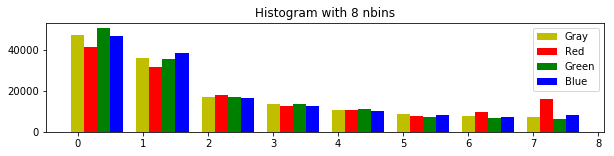

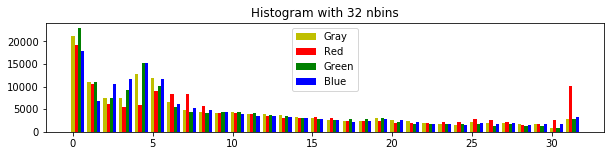

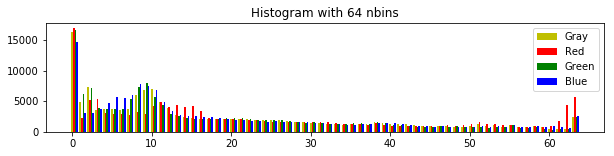

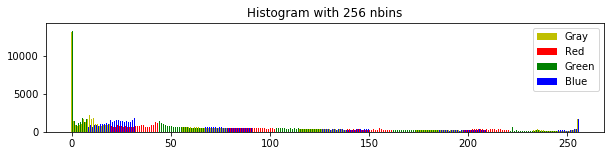

In [18]:
histograma_(8)
histograma_(32)
histograma_(64)
histograma_(256)

b) Read the image `face.png` and convolve it with a horizontal mask `mask_h1d=[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1]` after the mask normalization. Afterwards, substract the obtained image to the original one and save the new image. 

***To make your code legible, the resulted images should be shown in a 3x1 plot, with the following titles: a) 'Original image', b) 'Convolved image' and c) 'Difference with the original image'***

Hint: the `convolve` command belongs to the library `ndimage` of `scipy`. 

- Observe and comment how the ***type*** and the ***range of values (max & min)*** changed when different operations have been applied on the image. 

- Plot the different images ((a)original image, (b)intermediate and (c)final) on a figure with multiple images. Put titles on the image plots to explain what each image represents. Is the type of the mask important for the convolution? How is the image changed after the convolution? You need to repeat several times the convolution. Moreover, you need to also use bigger masks in order to observe better the effect of it. Present at least 5 experiments commenting the results obtained and their differences.

Note: Remember that `matplotlib.pyplot` automatically rescales the pixel values of the image before displaying them. Visualize with and without values range rescaling.

Note: The command `convolve` performs a multidimensional convolution! A vector should be represented as: [[1,...1]].

In [19]:
#ATENCIÓ! aquesta funció s'utilitza en els següents exercicis, cal executar-la.

def print_1x3(face,face_convolved,face_difference,title):
    fig, axarr = plt.subplots(1,3)
    fig.set_size_inches(25,10)
    axarr[0].imshow(face,cmap='gray')
    axarr[0].set_title('Original image' + title)
    axarr[0].xaxis.set_visible(False)
    axarr[0].yaxis.set_visible(False)
    axarr[1].imshow(face_convolved,cmap='gray')
    axarr[1].set_title('Convolved Image' + title)
    axarr[1].xaxis.set_visible(False)
    axarr[1].yaxis.set_visible(False)
    axarr[2].imshow(face_difference, cmap='gray')
    axarr[2].set_title('Difference Image' + title)
    axarr[2].xaxis.set_visible(False)
    axarr[2].yaxis.set_visible(False)
    plt.show()


def print_1x3_titles(face,face_convolved,face_difference,title1,title2,title3):
    fig, axarr = plt.subplots(1,3)
    fig.set_size_inches(25,10)
    axarr[0].imshow(face,cmap='gray')
    axarr[0].set_title(title1)
    axarr[0].xaxis.set_visible(False)
    axarr[0].yaxis.set_visible(False)
    axarr[1].imshow(face_convolved,cmap='gray')
    axarr[1].set_title(title2)
    axarr[1].xaxis.set_visible(False)
    axarr[1].yaxis.set_visible(False)
    axarr[2].imshow(face_difference, cmap='gray')
    axarr[2].set_title(title3)
    axarr[2].xaxis.set_visible(False)
    axarr[2].yaxis.set_visible(False)
    plt.show()

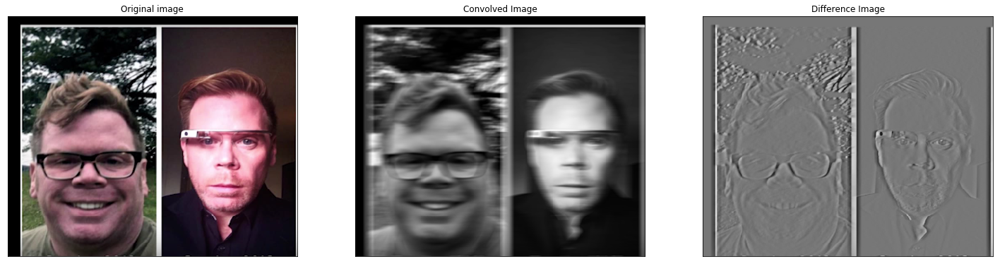

float64 0.0 1.0
float64 0.0 0.995699294118
float64 -0.672207895425 0.769915503268


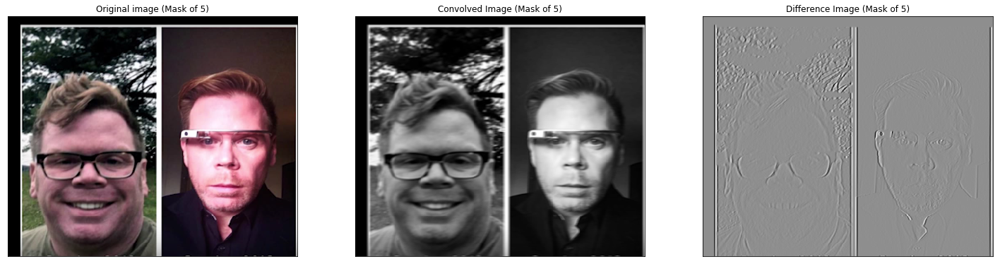

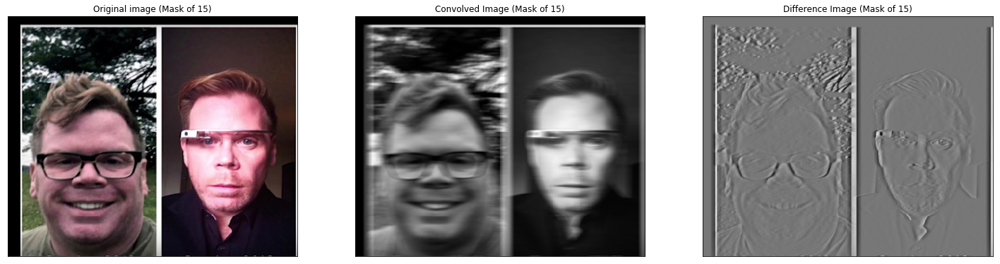

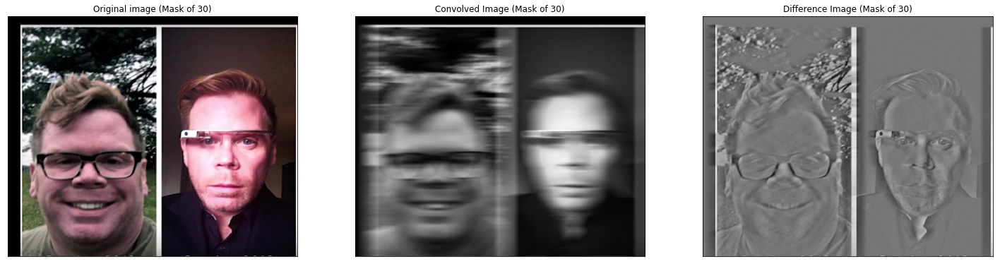

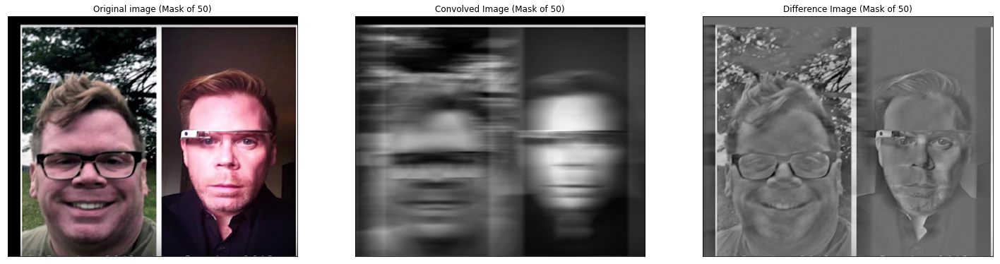

In [20]:
from scipy.ndimage import convolve
from skimage.color import rgb2gray


face = io.imread('images/face.png')
face_convolved = face.copy()
face_gray = rgb2gray(face)

mask = np.ones((1,15))/15
face_convolved = convolve(face_gray,mask)
face_difference= face_gray-face_convolved

print_1x3(face,face_convolved,face_difference,"")

print(face_gray.dtype, face_gray.min(), face_gray.max())
print(face_convolved.dtype, face_convolved.min(), face_convolved.max())
print(face_difference.dtype, face_difference.min(), face_difference.max())

######################
############
######################

face = io.imread('images/face.png')
face_convolved = face.copy()
face_gray = rgb2gray(face)

mask = np.ones((1,5))/5
face_convolved = convolve(face_gray,mask)
face_difference= face_gray-face_convolved

print_1x3(face,face_convolved,face_difference," (Mask of 5)")

######################
############
######################

face = io.imread('images/face.png')
face_convolved = face.copy()
face_gray = rgb2gray(face)

mask = np.ones((1,15))/15
face_convolved = convolve(face_gray,mask)
face_difference= face_gray-face_convolved

print_1x3(face,face_convolved,face_difference," (Mask of 15)")

######################
############
######################

face = io.imread('images/face.png')
face_convolved = face.copy()
face_gray = rgb2gray(face)

mask = np.ones((1,30))/30
face_convolved = convolve(face_gray,mask)
face_difference= face_gray-face_convolved

print_1x3(face,face_convolved,face_difference," (Mask of 30)")

######################
############
######################

face = io.imread('images/face.png')
face_convolved = face.copy()
face_gray = rgb2gray(face)

mask = np.ones((1,50))/50
face_convolved = convolve(face_gray,mask)
face_difference= face_gray-face_convolved

print_1x3(face,face_convolved,face_difference," (Mask of 50)")



Els diferents valors max i min de les imatges varia. En l'imatge original' hi ha un rang complet, de 0 a 1 (o de 0 a 255), al 
fer la convulació el minim es manté(no hauriem de poder obtenir valors menors de 0 al convular) i el màxim es redueix, ja que 
estem modificant els diferents pixels de la imatge i això fa que el màxim sigui menor.
La diferència entre les dos imatges obviament podria prendre valors entre el maxim de la primera i el maxim de la segona
(però en negatiu)

El tipus de màscara és important, ja que aquesta és la que determina com es realitzarà la convulació, la forma en que "s'homogenitzen" les imatges depen de la màscara. Una màscara més gran implicarà canvis més grans(parlant de mesures)
en l'imatge a convular.

Després de la convulació els valors que tenen els pixels de la imatge són modificats. Realment el que fem al convular és "suavitzar" la imatge, pel que depenent dels veins de cada pixel, es pot modificar el valor d'aquests.

En la diferència entre les dos imatges, es pot veure el contorn del contingut de la imatge, ja que allà on hi ha més variació de color és on la convulació hi afecta més, de manera que les zones més modificades les podem veure en la tercera imatge.

Com es pot veure en els diferents exemples mostrats, com més gran és la màscara més pixels es tenen en compte a l'hora de suavitzar la imatge, pel que com més gran, més borrosa es veurà la imatge.



c) Convolve the image with a vertical one-dimensional mask. Compute and visualize the 3 images (a,b,c).

- Extract the image's histograms and visualize them. 

- Compare the results with those of the previous exercise. How does the image change?

In [21]:
#ATENCIÓ! aquesta funció s'utilitza en els següents exercicis, cal executar-la.

from skimage.color import rgb2gray
from skimage import img_as_float
from skimage import exposure

def histograma_1(nbins_in, image, image2, image3, title):

    hist_gray, bins_gray = exposure.histogram(image, nbins = nbins_in)
    hist_r, bins_r = exposure.histogram(image2, nbins = nbins_in)
    hist_g, bins_g = exposure.histogram(image3, nbins = nbins_in)

    fig, ax = plt.subplots(figsize=(10,2))

    ind = np.arange(nbins_in)
    width = 0.2
    
    
    rects_gray = ax.bar(ind, hist_gray, width, color = 'y')
    rects_r = ax.bar(ind + width, hist_r, width, color = 'r')
    rects_g = ax.bar(ind + 2 * width, hist_g, width, color = 'g')
    
    ax.legend((rects_gray[0], rects_r[0], rects_g[0]), ('original', 'convolve', 'difference'))
    ax.set_title('Histogram with '+ str(nbins_in) + ' nbins' + title)
    plt.show()

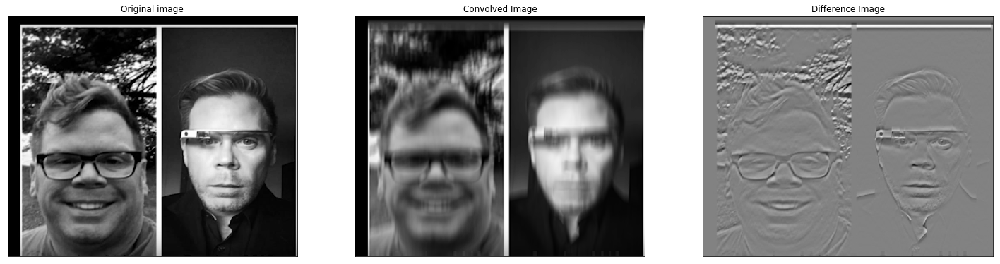

float64 0.0 1.0
float64 0.0 1.0
float64 -0.703201359477 0.679477647059


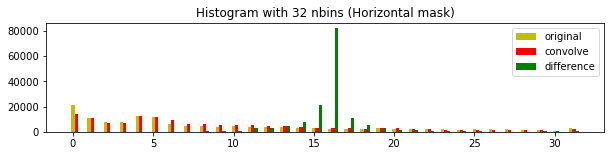

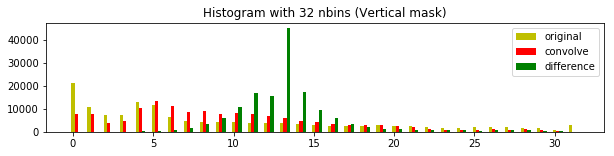

In [22]:
from scipy.ndimage import convolve
from skimage.color import rgb2gray

face = io.imread('images/face.png')
face_convolved_1 = face.copy()
face_gray_1 = rgb2gray(face_convolved_1)

mask = np.ones((15,1))/15

face_convolved_1 = convolve(face_gray_1,mask)

face_difference_1 = face_gray.copy()
face_difference_1= face_gray_1-face_convolved_1

print_1x3(face_gray_1,face_convolved_1,face_difference_1,"")

print(face_gray_1.dtype, face_gray_1.min(), face_gray_1.max())
print(face_convolved_1.dtype, face_convolved_1.min(), face_convolved_1.max())
print(face_difference_1.dtype, face_difference_1.min(), face_difference_1.max())

histograma_1(32,face_gray_1, face_convolved_1, face_difference_1, " (Horizontal mask)")
histograma_1(32,face_gray, face_convolved, face_difference, " (Vertical mask)")

Canviant el la màscara de forma horitzontal a vertical podem veure una diferència a simple vista, la suavització de la imatge es nota en sentit vertical. Clarament, al canviar el sentit de la màscara, això canviara la forma en que es modifiquin els pixels, abans la imatge es modificava horitzontalment, i ara es modifica verticalment.

Podem veure com els histogrames son diferents. On es veu més la diferència, és als histogrames de les diferències, utilitzant la màscara horitzontal tenim els valors situats entre 15 i 20 nbins, mentre que modificant-ho amb la màscara vertical els valors estan, majoritàriament, entre 10 i 15 nbins. A més el valor que pren la imatge també varia.


d) Convolve the original image with a uniform `two-dimensional` mask of dimensions 15x15 and with all values set to 1. Compute and visualize the 3 images (a,b,c).

- Extract the image's histograms and visualize them. 

- Compare the results with those of the previous exercise.

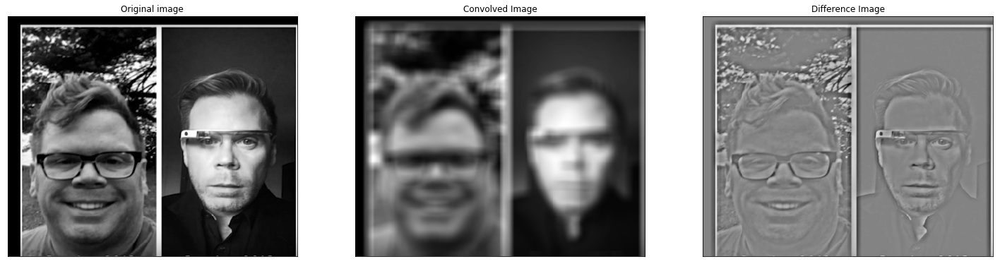

float64 0.0 1.0
float64 0.0 0.943870771242
float64 -0.801120932462 0.748931621786


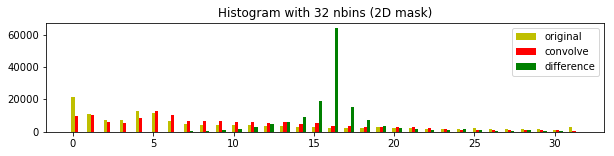

In [23]:
from scipy.ndimage import convolve
from skimage.color import rgb2gray

face = io.imread('images/face.png')
face_convolved_2 = face.copy()
face_gray_2 = rgb2gray(face)

mask = np.ones((15,15))/225

face_convolved_2 = convolve(face_gray_2,mask)

face_difference_2 = face.copy()
face_difference_2 = face_gray_2-face_convolved_2

print_1x3(face_gray_2, face_convolved_2, face_difference_2, "")

print(face_gray_2.dtype, face_gray_2.min(), face_gray_2.max())
print(face_convolved_2.dtype, face_convolved_2.min(), face_convolved_2.max())
print(face_difference_2.dtype, face_difference_2.min(), face_difference_2.max())

histograma_1(32, face_gray_2, face_convolved_2, face_difference_2, " (2D mask)")

Com podem veure hi ha una diferència notable entre els dos exercicis anteriors i el resultat d'utilitzar una màscara 2D. Estem suavitzant en ambdos sentits, o sigui, bidimensionalment.Es modifiquen pràcticament tots els valors de la imatge original, encara que sigui en una mesura petita. Als histogrames podem veure que els valors de la diferència s'han desplaçat cap a la dreta, situant-se en un rang major, entre 15 i 32 nbins.

e) Can we convolve a color image? 

Implement a 3-channel filter, apply it, visualize the 3 images (a, b and c) and comment the results obtained.

Which is the result obtained when applying a single-channel filter channel by channel separately? Visualize again the three images (original, convolved and difference) and compare the results.

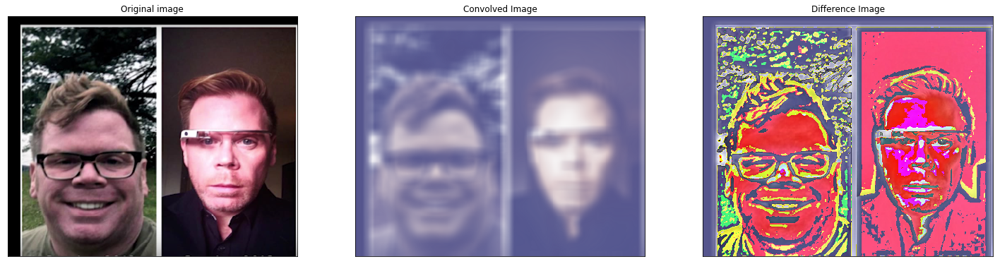

uint8 0 255
uint8 0 253
uint8 0 255


In [24]:
from scipy.ndimage import convolve
from skimage.color import rgb2gray

face = io.imread('images/face.png')
face_convolved_3 = face.copy()


mask = np.ones((15,15,3))/675

face_convolved_3 = convolve(face_convolved_3,mask)
face_difference_3 = face.copy()

face_difference_3 = face_convolved_3-face

print_1x3(face, face_convolved_3, face_difference_3, "")

print(face.dtype, face.min(), face.max())
print(face_convolved_3.dtype, face_convolved_3.min(), face_convolved_3.max())
print(face_difference_3.dtype, face_difference_3.min(), face_difference_3.max())

Hem pogut convular una imatge en color, el resultat evidentment té diferents colors, però si fessim aquesta imatge en grayscale, obtindriem un resultat semblant al que hem fet anteriorment.


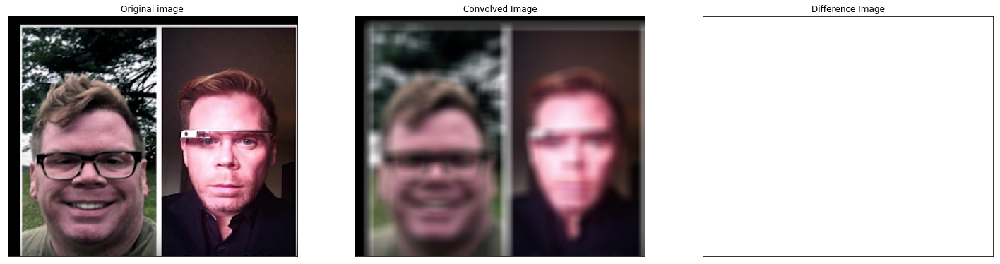

uint8 0 255
uint8 0 255
uint8 0 255


In [25]:
from scipy.ndimage import convolve
from skimage.color import rgb2gray

face = io.imread('images/face.png')
    
faceR = face.copy()
faceG = face.copy()
faceB = face.copy()
faceT = face.copy()

faceR = img_as_float(faceR[:,:,0])
faceG = img_as_float(faceG[:,:,1])
faceB = img_as_float(faceB[:,:,2])

mask = np.ones((15,15))/225

faceR = convolve(faceR,mask)
faceG = convolve(faceG,mask)
faceB = convolve(faceB,mask)

faceS = face.copy()
for i in range(face.shape[0]):
    for j in range(face.shape[1]):
        faceT[i,j] = [faceR[i,j]*255,faceG[i,j]*255,faceB[i,j]*255, 255]
        #faceS[i,j] = [face[i,j][0]-faceT[i,j][0], face[i,j][1]-faceT[i,j][1], 
        #              face[i,j][2]-faceT[i,j][2], face[i,j][3]-faceT[i,j][3]]
        
faceS = face-faceT
print_1x3(face, faceT, faceS, "")

print(face.dtype, face.min(), face.max())
print(faceT.dtype, faceT.min(), faceT.max())
print(faceS.dtype, faceS.min(), faceS.max())


El resultat obtingut fent la convulació canal per canal és igual a les que hem fet en grayscale, però a color, un resultat esperat. Però al fer la diferència no hem aconseguit imprimir-ho bé.

Given a color image (im), what is the difference between ***a*** and ***b*** ?
   
*** a) ***

im_2=np.array(im, dtype='float')


*** b) ***

im_2=np.array(im)


im_2=img_as_float(im_2)

In [26]:
#ATENCIÓ! aquesta funció s'utilitza en els següents exercicis, cal executar-la.

def print_1x1(face,title):
    fig, axarr = plt.subplots(1,1)
    fig.set_size_inches(10,10)
    axarr.imshow(face,cmap='gray')
    axarr.set_title(title)
    axarr.xaxis.set_visible(False)
    axarr.yaxis.set_visible(False)

    plt.show()


def print_1x1_axis(face,title):
    fig, axarr = plt.subplots(1,1)
    fig.set_size_inches(10,10)
    axarr.imshow(face,cmap='gray')
    axarr.set_title(title)
    axarr.xaxis.set_visible(True)
    axarr.yaxis.set_visible(True)

    plt.show()

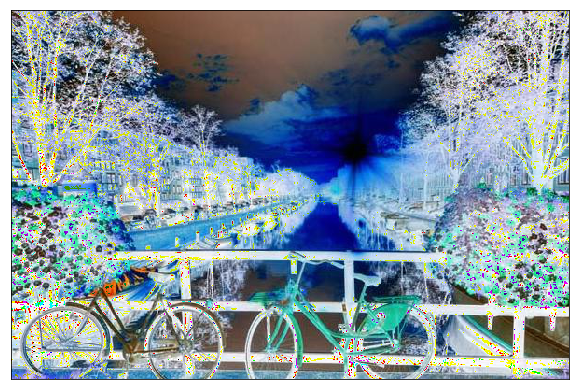

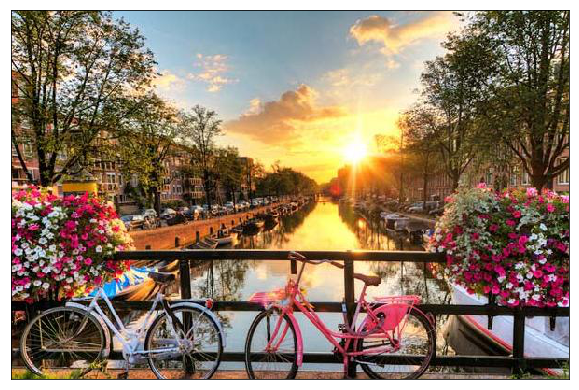

In [27]:
amsterdam = io.imread('images/amsterdam.jpg')
im_2=np.array(amsterdam, dtype='float')
print_1x1(im_2,"")

im_3=np.array(amsterdam)
im_3=img_as_float(im_3)

print_1x1(im_3,"")


La diferència entre la imatge 2 i la imatge 3 és la forma en que s'estan representant els valors. La im_2 té com a valor màxim 255 i com a valor mínim 0 en format float. Això fa que si representem la imatge els colors no es vegin correctament, però si dividim els valors de la im_2 per 255, per tal d'escalar-ho bé, obtenim la imatge correctament. Per això, al següent exercici utilitzarem im_2/255, per tal d'obtenir un resultat reconeixible. 

f) Change the size of the image a) reducing it 10 times ***and*** b) augmenting it two times. 

Observe if the histogram (i.e. nbins = 32) of the new images changed, and comment what happens and why. 

Apply the convolution on the three images with the same two dimensional uniform mask and comment the results.
Note: Observe what is the output of the command `resize`.


In [28]:
from skimage.color import rgb2gray
from skimage import img_as_float
from skimage import exposure

def histograma_RGB(nbins_in, imatge, title):
    face_gray = imatge.copy()
    faceR = imatge.copy()
    faceG = imatge.copy()
    faceB = imatge.copy()

    face_gray = rgb2gray(imatge)
    faceR = img_as_float(faceR[:,:,0])
    faceG = img_as_float(faceG[:,:,1])
    faceB = img_as_float(faceB[:,:,2])
    
    hist_gray, bins_gray = exposure.histogram(face_gray, nbins = nbins_in)
    hist_r, bins_r = exposure.histogram(faceR, nbins = nbins_in)
    hist_g, bins_g = exposure.histogram(faceG, nbins = nbins_in)
    hist_b, bins_b = exposure.histogram(faceB, nbins = nbins_in)

    fig, ax = plt.subplots(figsize=(10,2))

    ind = np.arange(nbins_in)
    width = 0.2
    
    
    rects_gray = ax.bar(ind, hist_gray, width, color = 'y')
    rects_r = ax.bar(ind + width, hist_r, width, color = 'r')
    rects_g = ax.bar(ind + 2 * width, hist_g, width, color = 'g')
    rects_b = ax.bar(ind + 3 * width, hist_b, width, color = 'b')
    
    ax.legend((rects_gray[0], rects_r[0], rects_g[0], rects_b[0]), ('Gray', 'Red', 'Green', 'Blue'))
    ax.set_title('Histogram with '+ str(nbins_in) + ' nbins. ' + title)
    plt.show()

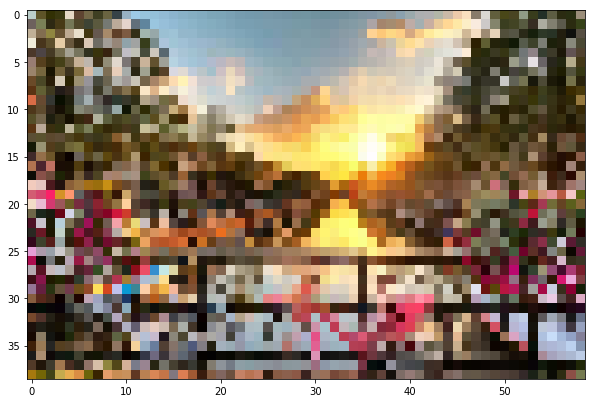

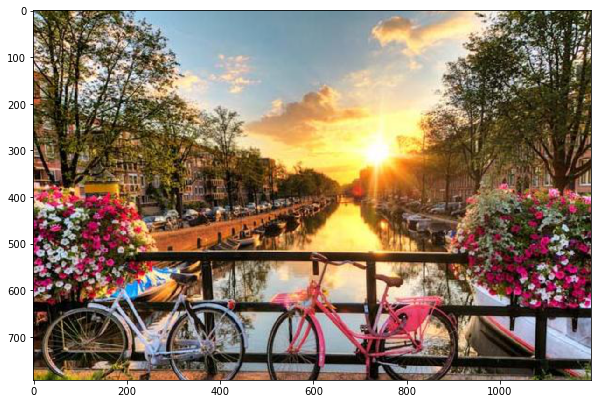

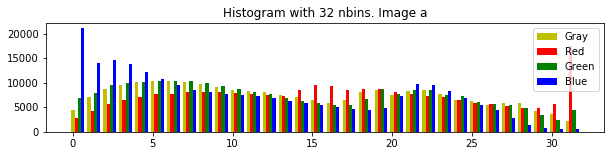

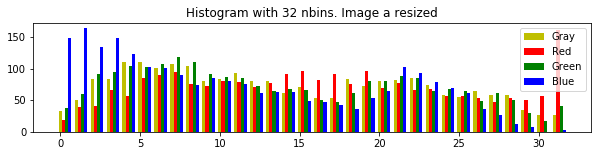

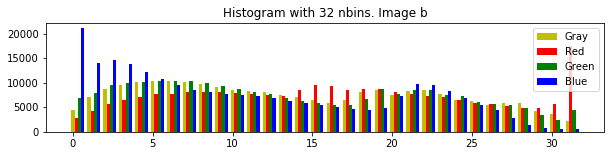

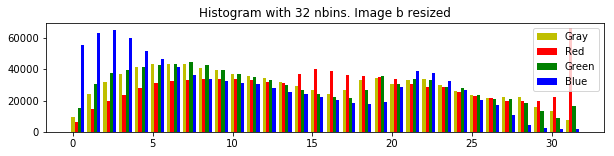

In [29]:
from skimage.transform import resize

x = (int(im_2.shape[0]/10))
y = (int(im_2.shape[1]/10))
imatge2 = im_2.copy()
imatge_resize = resize(imatge2/255, (x,y), mode = 'reflect')
#imatge_resize = rescale(imatge2, 1/10, mode = 'reflect')

print_1x1_axis(imatge_resize,"")

imatge2_resize = resize(im_3, (im_3.shape[0]*2, im_3.shape[1]*2), mode = 'reflect')

print_1x1_axis(imatge2_resize,"")

histograma_RGB(32, im_2, "Image a")
histograma_RGB(32, imatge_resize, "Image a resized")
histograma_RGB(32, im_3, "Image b")
histograma_RGB(32, imatge2_resize, "Image b resized")

La comanda resize ens retorna una ndarray amb les noves mides.
També hem probat de fer servir la comanda rescale en lloc de resize, per veure el funcionament d'aquesta.
Als histogrames podem veure com hi ha una diferència en la quantitat de pixels amb els que treballem, en la imatge a feta petita, hi ha molts pocs elements que mostrar a la gràfica en comparació amb la imatge b feta grossa, com podem veure en l'eix y de les gràfiques.
Mentre que per a la imatge b es manté la imatge amb el mateix aspecte, la imatge a és quasi "irreconeixible". A les gràfiques podem veure que es manté la mateixa proporció de color, però al representar la imatge en menys pixels la resolució és molt baixa i no es veu bé. Si representem la im_2 sense dividir per 255, apareixen tot de pixels aparentment aleatoris, i no ens interessa aquest resultat.


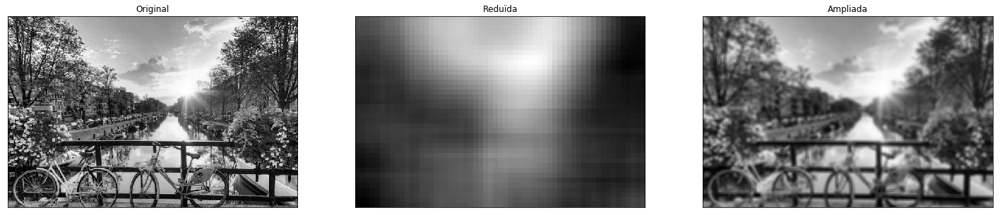

In [30]:
from scipy.ndimage import convolve
from skimage.color import rgb2gray

amsterdam_gray = rgb2gray(amsterdam)

mask = np.ones((15,15))/225

imatge_resize_convolved = convolve(rgb2gray(imatge_resize),mask)
imatge2_resize_convolved = convolve(rgb2gray(imatge2_resize),mask)

print_1x3_titles(amsterdam_gray, imatge_resize_convolved, imatge2_resize_convolved, "Original", "Reduïda", "Ampliada")

Convulant les imatges podem veure que si convulem la imatge reduïda no hi ha res reconeixible, i a la imatge ampliada es veu borrós degut a la cantitat de pixels que hi ha i la mesura de la màscara.

### 2.2 Image processing with weighting and non-linear filters


a) Generate the following kernels and apply them to the original image of the previous exercise:

- Gaussian kernel with sigma = 1
- Gaussian kernel with a different sigma value. Which is the most adequate value for keeping the main objects and structures of the image?
- Median filter.

Comment the effect of using different kinds of filters on the original image.

Hint: use the skimage.filters function for creating the different filters.

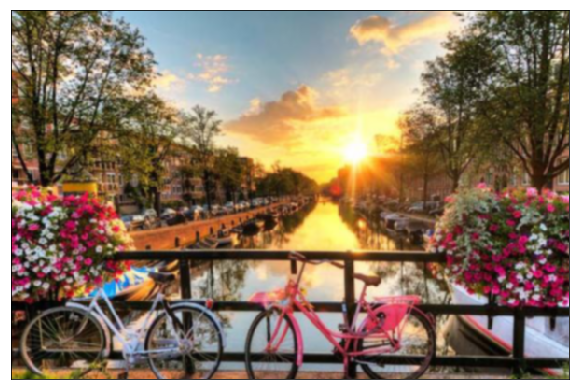

In [31]:
from skimage.filters import gaussian
amsterdam = io.imread('images/amsterdam.jpg')
amsterdam = gaussian(amsterdam, sigma=1, multichannel=True)
print_1x1(amsterdam,"")

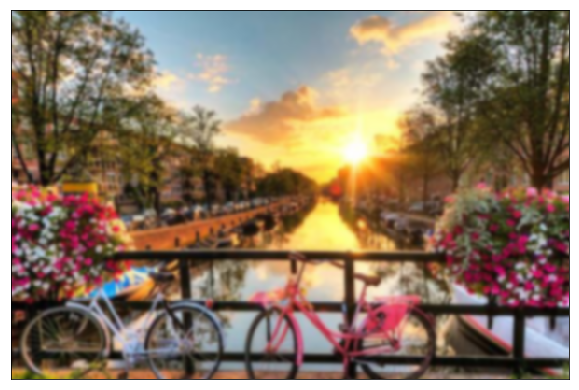

In [32]:
from skimage.filters import gaussian
amsterdamb = io.imread('images/amsterdam.jpg')
amsterdamb = gaussian(amsterdamb, sigma=1.7, multichannel=True)
print_1x1(amsterdamb,"")

Nosaltres fent probes creiem que un valor de sigma=1.7 és prou adecuat, però no sabem del tot segur si és el millor valor, caldria fer més proves per a determinar-ho.

C:\Users\sergi\Anaconda3\lib\site-packages\skimage\util\dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


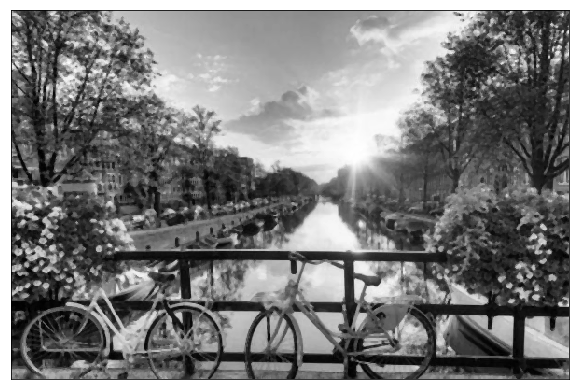

In [33]:
from skimage.filters.rank import median
from skimage.color import rgb2gray
from skimage import img_as_ubyte

amsterdamc = io.imread('images/amsterdam.jpg')
amsterdamc = img_as_ubyte(amsterdamc)
amsterdam_gray = rgb2gray(amsterdamc)
amsterdam_gray = median(amsterdam_gray)
print_1x1(amsterdam_gray,"")

Podem fer servir diferents filtres per a modificar la imatge original, amb el filtre gaussian podem fer borroses parts de la imatge, i amb el filtre median canviem la representació de la imatge. Hi ha una gran varietat de filtres que es poden utilitzar per a modificar l'aspecte d'una imatge, ja sigui un filtre de colors, o un filtre d'aspecte.

**(Optional)** Apply the smoothing on some other images and present their results.

### 2.3 Determine the optimal contour 

a) Load the 'logo.png' image and visualize its contours.	

Apply different contour extraction tecniques introduced during the theory session (prewitt, sobel and canny). Find the optimal parameteres for each of them.

Use subplot and title to visualize the results.

Which is the best countour detection technique? 

Which are the optimal parameters for this image? 

Is it necessary to normalize the mask as we do in the filtering applied for the smoothing? 

Hint: you can use skimage.feature.canny for applying the canny filter

Optional: Superimpose the contours over the image.

In [34]:
#ATENCIÓ! aquesta funció s'utilitza en els següents exercicis, cal executar-la.

def print_2x2(imatge1, imatge2, imatge3 , imatge4, title):
    fig, axarr = plt.subplots(2,2)
    fig.set_size_inches(25,10)
    
    axarr[0][0].imshow(imatge1,cmap='gray')
    axarr[0][0].set_title('Original Image' + title)
    axarr[0][0].xaxis.set_visible(False)
    axarr[0][0].yaxis.set_visible(False)
    
    axarr[0][1].imshow(imatge2,cmap='gray')
    axarr[0][1].set_title('Prewitt' + title)
    axarr[0][1].xaxis.set_visible(False)
    axarr[0][1].yaxis.set_visible(False)
    
    axarr[1][0].imshow(imatge3,cmap='gray')
    axarr[1][0].set_title('Sobel' + title)
    axarr[1][0].xaxis.set_visible(False)
    axarr[1][0].yaxis.set_visible(False)
    
    axarr[1][1].imshow(imatge4,cmap='gray')
    axarr[1][1].set_title('Canny' + title)
    axarr[1][1].xaxis.set_visible(False)
    axarr[1][1].yaxis.set_visible(False)
    
    plt.show()

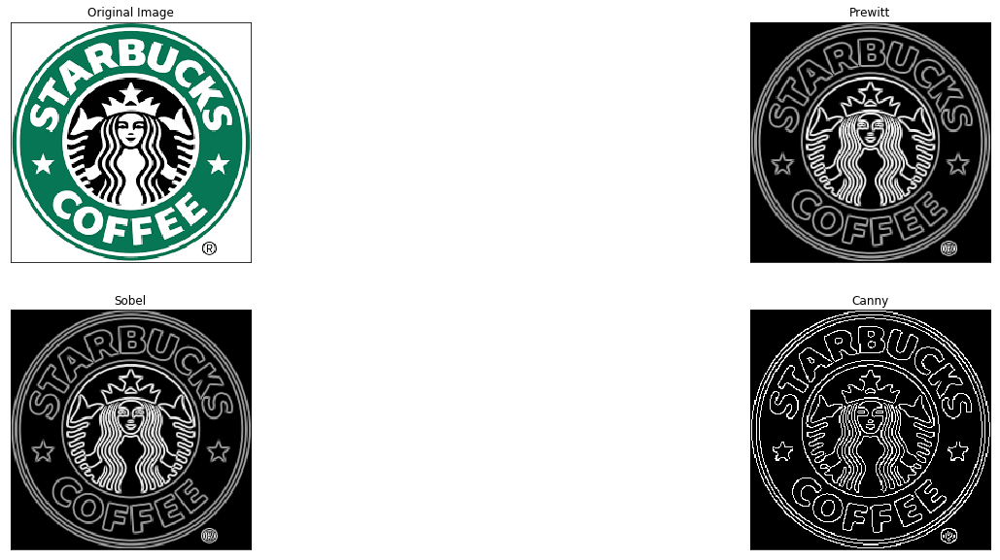

In [35]:
from skimage.filters import prewitt, sobel
from skimage.color import rgb2gray
from skimage import feature
logo = io.imread('images/logo.png')
logo_gray = rgb2gray(logo)

logo_prewitt = prewitt(logo_gray)

logo_sobel = sobel(logo_gray)

logo_canny = feature.canny(logo_gray, sigma = 1)

print_2x2(logo, logo_prewitt, logo_sobel, logo_canny, "")

Els filtres prewitt i sobel, poden tenir com a paràmetre una màscara per a limitar l'aplició de la màscara en una area concreta, per aixo no ho utilitzem. Pel filtre canny, hem utilitzat una sigma de 1, ja que creiem que obtenim els millors resultats per a aquesta imatge.
En aquest cas, és dificil determinar quina és la millor tècnica per a detectar el contorn, ja que el resultat dels filtres Prewitt i Sobel són molt semblants. Del que estem segurs és que descartem el filtre Canny.


b)	Repeat the experiment with other images, if you want you can use the ones included in the folder **images**. Comment if the parameters need to be changed for the different images.

- Are the contours improved if the image is previously smoothed ? 
- Which are the limitations of the different images contour extraction?

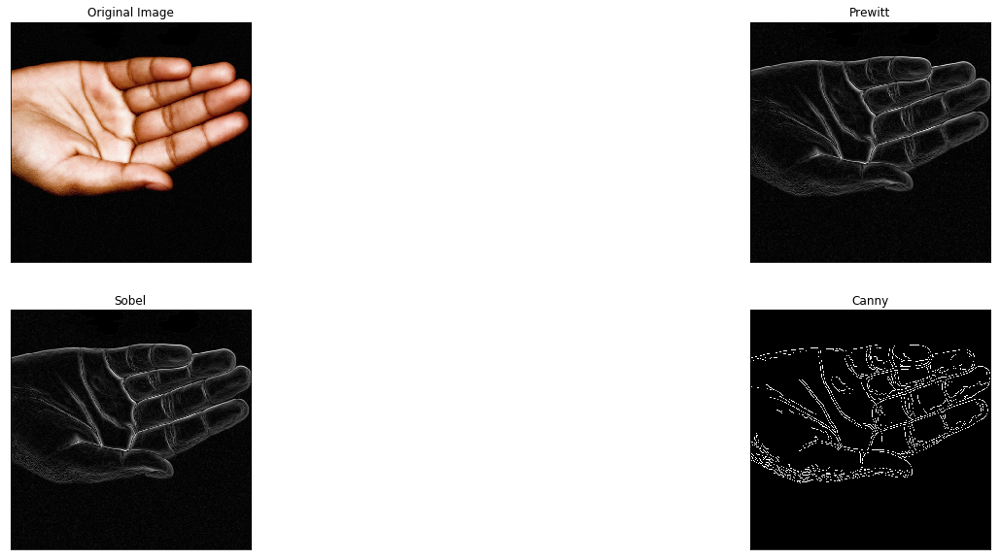

In [36]:
hand = io.imread('images/hand.jpg')

hand_gray = rgb2gray(hand)
hand_prewitt = prewitt(hand_gray)
hand_sobel = sobel(hand_gray)
hand_canny = feature.canny(hand_gray, sigma = 1)

print_2x2(hand, hand_prewitt, hand_sobel, hand_canny, "")

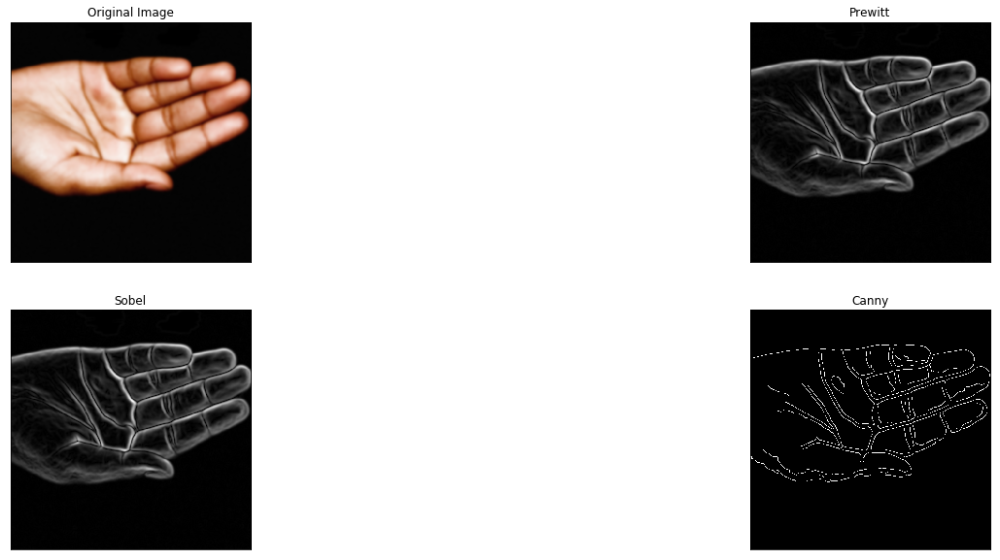

In [37]:
hand = io.imread('images/hand.jpg')
hand = gaussian(hand, sigma=2, multichannel=True)

hand_gray = rgb2gray(hand)
hand_prewitt = prewitt(hand_gray)
hand_sobel = sobel(hand_gray)
hand_canny = feature.canny(hand_gray, sigma = 1)

print_2x2(hand, hand_prewitt, hand_sobel, hand_canny, "")

Els contorns de la imatge milloren una mica si es suavitza la imatge abans de buscar els contorns.
Els filtres per a detectar contorns tenen limitacions en la detecció de coses petites. En imatges de baixa resolució serà més dificil trobar-hi un contorn real, mentre que en imatges d'alta resolució podem obtenir resultats bastant bons.

d) Optional: How many different ways can the Sobel detector be applied? Apply it (in all possible ways), and visualize and compare the obtained results.


### 2.4 Applying smoothing in order to obtain hybrid images

a) Given `Einstein.jpg` and `monroe.jpg` images, compute the hybrid image and visualize it (consult the theory slides for hybrid image definition).

Hint: In order to highlight the effect, in the low frequency image you should define a lower sigma, while for the high frequency image you should use a higher one. 

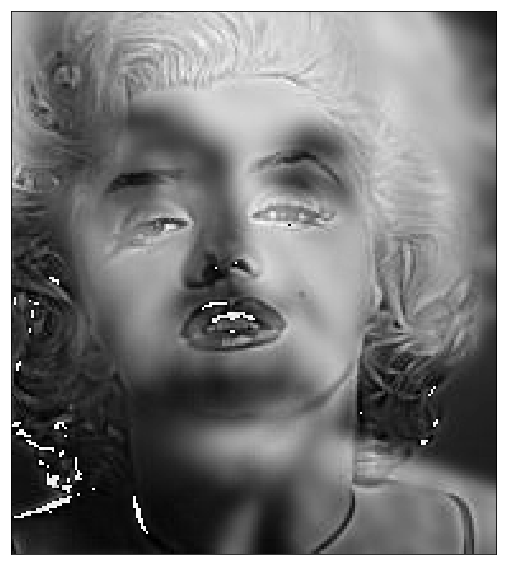

In [38]:
from skimage.filters import gaussian
from skimage.filters import laplace
from skimage.transform import rescale

einstein = io.imread('images/Einstein.jpg')
monroe = io.imread('images/monroe.jpg')

einstein = gaussian(einstein, sigma=3)

monroe_copy = monroe.copy()
monroe_copy = gaussian(monroe_copy, sigma=1.8)

monroeT = monroe.copy()

for i in range(monroe.shape[0]):
    for j in range(monroe.shape[1]):
        monroe_copy[i,j] = monroe[i,j] - monroe_copy[i,j]*255
        monroeT[i,j] = (einstein[i,j]*255+(monroe_copy[i,j]))
print_1x1(monroeT,"")
#plt.imshow(monroeT, cmap = 'gray')
#plt.show()
x = monroeT.shape[0]/2
y = monroeT.shape[1]/2
#monroe_copy = rescale(monroeT, (x,y))
#plt.imshow(monroe_copy, cmap = 'gray')
#plt.show()
#plt.imshow(monroeT, cmap = 'gray')
#plt.show()

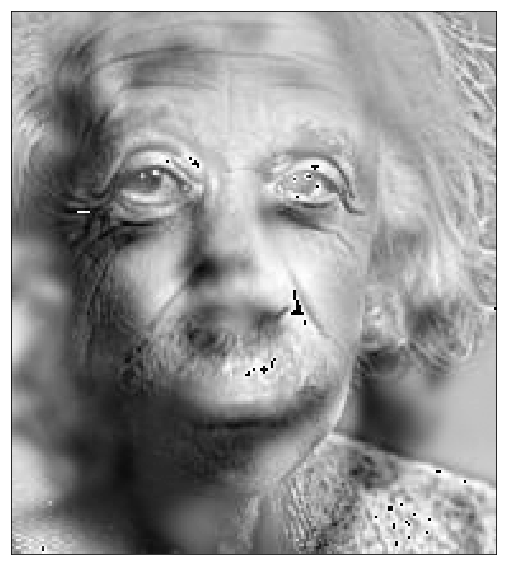

In [39]:
from skimage.filters import gaussian
from skimage.filters import laplace
from skimage.transform import rescale

einstein = io.imread('images/Einstein.jpg')
monroe = io.imread('images/monroe.jpg')

monroe = gaussian(monroe, sigma=3)

einstein_copy = einstein.copy()
einstein_copy = gaussian(einstein_copy, sigma=3)

einsteinT = einstein.copy()

for i in range(einstein.shape[0]):
    for j in range(einstein.shape[1]):
        einstein_copy[i,j] = einstein[i,j] - einstein_copy[i,j]*255
        einsteinT[i,j] = (monroe[i,j]*255+(einstein_copy[i,j]))
print_1x1(einsteinT,"")

b) Combine both hybrid images and visualize them. Analyze which is the best way of showing it if our aim is to see Marylin Monroe. Additionally, rescale the image to different size and comment the results. Present the different visualizations of the experiment performed.

Optional : compute hybrid images from other images. Apply it over color images.

Creiem que la millor manera de veure la Marylin és posant-la a baixa freqüència, per tant la millor imatge és la primera.

In [40]:
#ATENCIÓ! aquesta funció s'utilitza en els següents exercicis, cal executar-la.

def print_1x2m(imatge1, imatge2, title, x):
    fig, axarr = plt.subplots(1,2)
    fig.set_size_inches(x,x)
    
    axarr[0].imshow(imatge1,cmap='gray')
    axarr[0].set_title(title)
    axarr[0].xaxis.set_visible(False)
    axarr[0].yaxis.set_visible(False)
    
    axarr[1].imshow(imatge2,cmap='gray')
    axarr[1].set_title(title)
    axarr[1].xaxis.set_visible(False)
    axarr[1].yaxis.set_visible(False)
    
    plt.show()

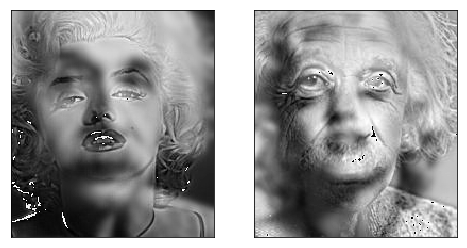

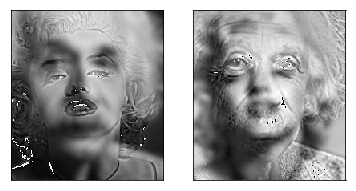

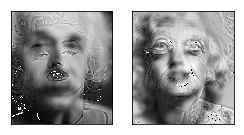

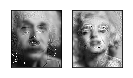

In [41]:
#print_1x4(rescale(monroeT, 1/2),rescale(monroeT, 1/4),rescale(monroeT, 1/6),rescale(monroeT, 1/8),"")
print_1x2m(monroeT,einsteinT,"",8)
print_1x2m(monroeT,einsteinT,"",6)
print_1x2m(monroeT,einsteinT,"",4)
print_1x2m(monroeT,einsteinT,"",2)

## 2.5 Anonimization of videos

One of the important problems in Computer Vision as a science that manages data (images and videos) is the anonimization of persons appearing in them. Given the collection of images in the folder collection bigbang, smooth the images in order to make unrecognizible the faces of the persons. Display sequentially the original and the anonimized images.

Help: 

- In order to read all images from a sequence, check the type [ImageCollection](http://scikit-image.org/docs/0.7.0/api/skimage.io.collection.html).

- In order to animate a sequence of images, you can use the animation library of matplotlib (in particular, [FuncAnimation](https://matplotlib.org/api/animation_api.html). 

Note that the animation library does not work with %matplotlib inline visualizing in the same notebook the images. You should use the matplotlib nbagg plugin to visualize the sequence of images in a different window. To this purpose, write before animation the following line:

% matplotlib nbagg



<IPython.core.display.Javascript object>


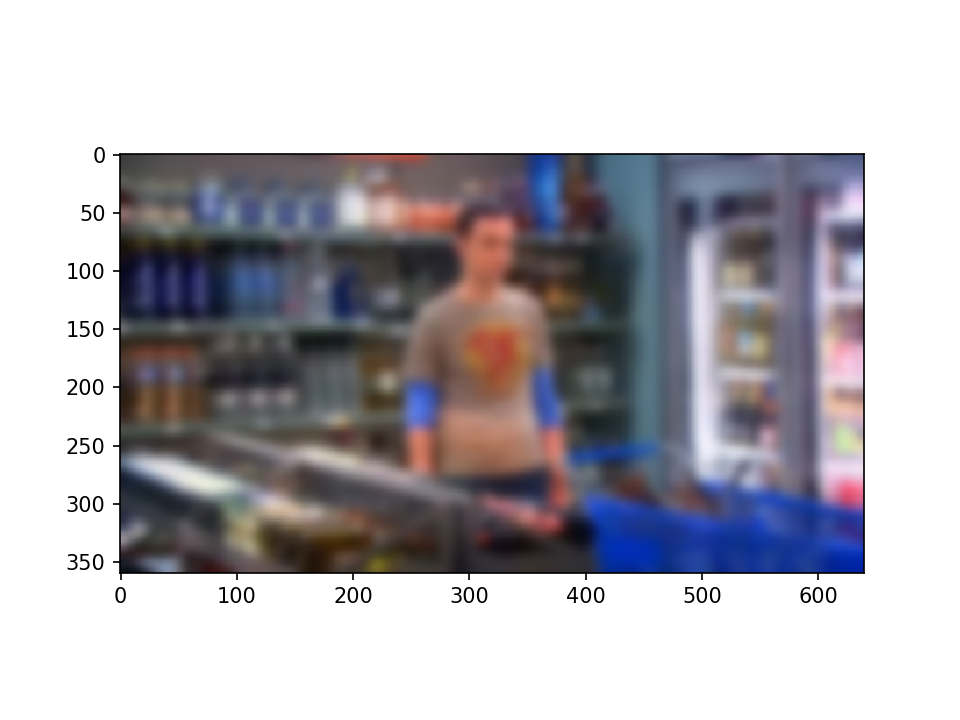

In [42]:
import numpy as np
import skimage
from skimage import io
import matplotlib.pyplot as plt
from skimage.filters import gaussian

llista_imatges = []
ic = io.ImageCollection('images/bigbangcollection/*.png')

for i in ic:    
    im_gaussian = gaussian(i, sigma=5,multichannel=True)
    llista_imatges.append(im_gaussian)
    
        # Reading a sequence of images from a folder

import matplotlib.animation as animation
%matplotlib nbagg 
    #Changing the pluggin is necessary always when visualizing a video!

i=0       #Inicializing the video display
fig = plt.figure()  # Create figure
im = plt.imshow(llista_imatges[i], animated=True) #Visualize the first image

def updatefig1(i):   #Updating the frame visualization
    if i>200:
        im.set_array(llista_imatges[i-200]) #Changing the content of the canvas
    else:
        im.set_array(ic[i])
    return im, #to return a tuple!

ani = animation.FuncAnimation(fig, updatefig1, interval=5, blit=False, frames=400, repeat= False)

Per a fer borroses les imatges del video, el que hem fet és aplicar un filtre gaussian amb sigma 3 a cada imatge de la colecció. Aquest procés implica un gran consum de memòria principal, ja que guardem les imatges temporalment en una llista, en cas de no tenir suficient memòria principal per a fer això, es podria modificar per a guardar les imatges en una nova carpeta, i llavors obrir les imatgs com a imageCollection, de forma que les dades les tindriem guardades a disc i no a la ram(actualment tenim carregades les imatges de la imageCollection i les imatges modificades).
Per a sigma major, més borroses es veuran les imatges, però amb sigma=3 és suficient per a anonimitzar les imatges.

**Delivery**

Compressed file P2_Student1_Student2.zip that includes:

   - The notebook P2_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
   - The images used that are not provided in P2.zip.

**Deadline** (Campus Virtual): October 17, 11:00 p.m.
